In [1]:
import pycaret
pycaret.__version__

'3.0.0.rc4'

# Dataset

In [2]:
from pycaret.datasets import get_data
data = get_data('mice')

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


# Init Setup

In [3]:
from pycaret.clustering import *
s = setup(data, ignore_features = ['MouseID'], session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(1080, 81)"
2,Transformed data shape,"(1080, 88)"
3,Ignore features,1
4,Ordinal features,3
5,Numeric features,77
6,Categorical features,4
7,Rows with missing values,48.9%
8,Preprocess,True
9,Imputation type,simple


# Train Model

In [4]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


In [5]:
kmeans = create_model('kmeans', num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1523,220.6188,1.7555,0,0,0


In [6]:
kmeans_results = assign_model(kmeans)
kmeans_results.head()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class,Cluster
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m,Cluster 0
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m,Cluster 0
2,0.509183,0.730247,0.418309,2.687201,5.622058,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m,Cluster 0
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m,Cluster 0
4,0.434940,0.617430,0.358802,2.365785,4.718678,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m,Cluster 2


# Analyze Clusters

In [7]:
kmeans_results.groupby(by='Cluster').mean()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
Cluster,,,,,,,,,,,,,,,,,,,,,
Cluster 0,0.652849,0.873497,0.382048,2.744952,5.191153,0.224322,0.181012,3.065243,0.226831,1.862015,...,0.216923,0.138929,0.124783,0.124035,0.119722,0.494525,0.132223,0.162312,0.156336,1.595509
Cluster 1,0.295640,0.482588,0.305405,2.219661,3.494734,0.249025,0.194204,3.795938,0.218390,1.317836,...,0.232287,0.165235,0.143657,0.128135,0.138393,0.446681,0.199515,0.203105,0.231788,1.134579
Cluster 2,0.507185,0.696865,0.316734,2.272167,3.783984,0.215618,0.169441,2.710528,0.201324,1.456848,...,0.219159,0.150606,0.126029,0.111258,0.122808,0.434483,0.148096,0.163160,0.179564,1.638090
Cluster 3,0.402272,0.619021,0.339821,2.477514,4.352323,0.254998,0.191904,5.517341,0.230068,1.410138,...,0.225493,0.158168,0.132909,0.127634,0.125184,0.467642,0.174617,0.181445,0.202821,1.178239
Cluster 4,0.376198,0.519690,0.263969,1.840832,2.700623,0.208859,0.164097,2.175677,0.182315,1.217061,...,0.236513,0.172396,0.146222,0.112972,0.145462,0.389314,0.178464,0.199550,0.234682,1.277731


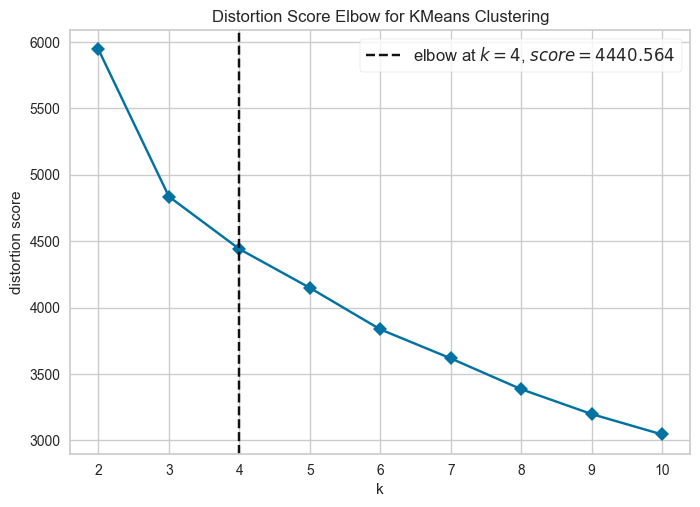

In [8]:
plot_model(kmeans, plot = 'elbow')

In [9]:
kmeans = create_model('kmeans', num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1523,220.6188,1.7555,0,0,0


In [10]:
kmeans = create_model('kmeans', num_clusters = 4)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1751,251.4648,1.7884,0,0,0


In [11]:
plot_model(kmeans, plot = 'cluster')

In [12]:
plot_model(kmeans, plot = 'tsne')

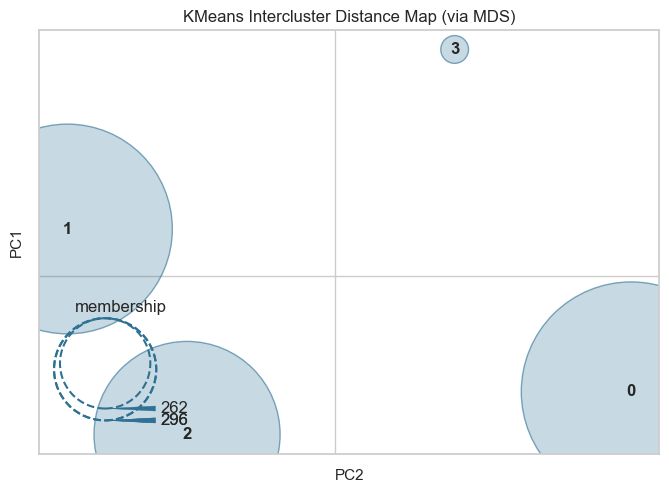

In [13]:
plot_model(kmeans, plot = 'distance')

In [14]:
plot_model(kmeans, plot = 'distribution')

In [15]:
plot_model(kmeans, plot = 'distribution', feature = 'ITSN1_N')

# Predicting Clusters on new / unseen data

In [16]:
new_data = data.copy()

In [17]:
predictions = predict_model(kmeans, new_data)
predictions.head()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,Behavior,class_c-CS-m,class_c-SC-m,class_c-CS-s,class_c-SC-s,class_t-CS-m,class_t-SC-m,class_t-CS-s,class_t-SC-s,Cluster
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
2,0.509183,0.730247,0.418309,2.687201,5.622058,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
4,0.434940,0.617430,0.358802,2.365785,4.718678,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3


# Saving / Loading Pipeline

In [18]:
save_model(kmeans, 'kmeans_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=C:\Users\owner\AppData\Local\Temp\joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['DYRK1A_N', 'ITSN1_N', 'BDNF_N',
                                              'NR1_N', 'NR2A_N', 'pAKT_N',
                                              'pBRAF_N', 'pCAMKII_N', 'pCREB_N',
                                              'pELK_N', 'pERK_N', 'pJNK_N',
                                              'PKCA_N', 'pMEK_N', 'pNR1_N',
                                              'pNR2A_N', 'pNR2B_N', 'pPKCAB_N',
                                              'pRSK_N', 'AKT_N', 'BRAF_N',
                                              'CAMKII_N', 'CREB_N', '...
                                                                         {'col': 'Behavior',
                                                                          'mapping': {nan: -1,
                                                                                  

In [19]:
kmeans_pipeline = load_model('kmeans_pipeline')

Transformation Pipeline and Model Successfully Loaded


In [20]:
kmeans_pipeline

Pipeline(memory=Memory(location=C:\Users\owner\AppData\Local\Temp\joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['DYRK1A_N', 'ITSN1_N', 'BDNF_N',
                                             'NR1_N', 'NR2A_N', 'pAKT_N',
                                             'pBRAF_N', 'pCAMKII_N', 'pCREB_N',
                                             'pELK_N', 'pERK_N', 'pJNK_N',
                                             'PKCA_N', 'pMEK_N', 'pNR1_N',
                                             'pNR2A_N', 'pNR2B_N', 'pPKCAB_N',
                                             'pRSK_N', 'AKT_N', 'BRAF_N',
                                             'CAMKII_N', 'CREB_N', '...
                                                                        {'col': 'Behavior',
                                                                         'mapping': {nan: -1,
                                                                                     'C/S': 0,
                                                                                     'S/C': 1}}]))),
                ('onehot_encoding',
                 TransformerWrapper(include=['class'],
                                    transformer=OneHotEncoder(cols=['class'],
                                                              handle_missing='return_nan',
                                                              use_cat_names=True))),
                ('low_variance',
                 TransformerWrapper(exclude=[],
                                    transformer=VarianceThreshold(threshold=0))),
                ('trained_model', KMeans(n_clusters=4, random_state=123))])